In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import math


# Read in an image
image = mpimg.imread('test_images/test5.jpg')

ksize = 15

In [2]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
  # 1) Convert to grayscale
  gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  # 2) Take the derivative in x or y given orient = 'x' or 'y'
  if orient is 'x':
      sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
  else:
      sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
  # 3) Take the absolute value of the derivative or gradient
  abs_sobel = np.absolute(sobel)
  # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
  scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
  # 5) Create a mask of 1's where the scaled gradient magnitude 
  grad_binary = np.zeros_like(scaled_sobel)
          # is > thresh_min and < thresh_max
  grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
  # 6) Return this mask as your binary_output image
  return grad_binary
def abs_channel_sobel_thresh(img, channel=0, orient='x', sobel_kernel=3, thresh=(0, 255)):
  # 1) Convert to grayscale
  c_img = img[:,:,channel]
  # 2) Take the derivative in x or y given orient = 'x' or 'y'
  if orient is 'x':
      sobel = cv2.Sobel(c_img, cv2.CV_64F, 1, 0)
  else:
      sobel = cv2.Sobel(c_img, cv2.CV_64F, 0, 1)
  # 3) Take the absolute value of the derivative or gradient
  abs_sobel = np.absolute(sobel)
  # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
  scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
  # 5) Create a mask of 1's where the scaled gradient magnitude 
  grad_binary = np.zeros_like(scaled_sobel)
          # is > thresh_min and < thresh_max
  grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
  # 6) Return this mask as your binary_output image
  return grad_binary

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
  # 1) Convert to grayscale
  gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
  # 2) Take the gradient in x and y separately
  sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
  sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
  # 3) Calculate the magnitude 
  sobel = ((sobelx)**2 + (sobely)**2)**0.5
  # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
  scaled_sobel = np.uint8(255*sobel/np.max(sobel))
  # 5) Create a binary mask where mag thresholds are met
  mag_binary = np.zeros_like(scaled_sobel)
  # 6) Return this mask as your binary_output image
  mag_binary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
  return mag_binary

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
  # 1) Convert to grayscale
  gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
  # 2) Take the gradient in x and y separately
  sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
  sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
  # 3) Take the absolute value of the x and y gradients
  abs_sobelx = np.absolute(sobelx)
  abs_sobely = np.absolute(sobely)
  # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
  arc_tan_sobel = np.arctan2(abs_sobely, abs_sobelx)
  # 5) Create a binary mask where direction thresholds are met
  dir_binary = np.zeros_like(arc_tan_sobel)
  dir_binary[(arc_tan_sobel >= thresh[0]) & (arc_tan_sobel <= thresh[1])] = 1
  # 6) Return this mask as your binary_output image
  return dir_binary
  
def hls_threshold(image, channel='h', thresh=(0, 255)):
  hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS).astype(np.float)
  if channel is 'h':
    c_img = hls[:,:,0]
  elif channel is 'l':
    c_img = hls[:,:,1]
  else:
    c_img = hls[:,:,2]
  
  scaled_img = np.uint8(255*c_img/np.max(c_img))
  binary = np.zeros_like(scaled_img)
  binary[(scaled_img >= thresh[0]) & (scaled_img <= thresh[1])] = 1
  return binary

def hsv_threshold(image, channel='h', thresh=(0, 255)):
  hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
  if channel is 'h':
    c_img = hls[:,:,0]
  elif channel is 's':
    c_img = hls[:,:,1]
  else:
    c_img = hls[:,:,2]

  scaled_img = np.uint8(255*c_img/np.max(c_img))
  binary = np.zeros_like(scaled_img)
  binary[(scaled_img >= thresh[0]) & (scaled_img <= thresh[1])] = 50
  return binary

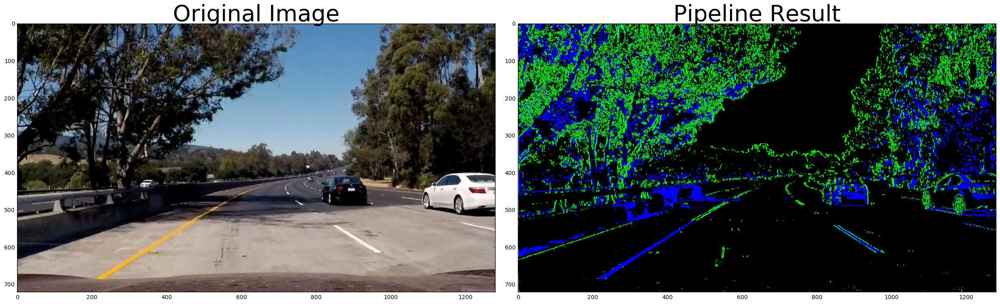

In [3]:
def sobel_x_abs(img, thresh):
    img = np.copy(img)
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return sxbinary
    
def s_binary(img, thresh):
    # Threshold color channel
    s_binary = np.zeros_like(img)
    s_binary[(img >= thresh[0]) & (img <= thresh[1])] = 1
    return s_binary

# Edit this function to create your own pipeline.
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV).astype(np.float)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    r_channel = img[:,:,0]
    v_channel = hsv[:,:,2]
    
    vx = sobel_x_abs(v_channel, sx_thresh)
    lx = sobel_x_abs(l_channel, sx_thresh)
    rx = sobel_x_abs(r_channel, sx_thresh)
    
    s_calc = s_binary(s_channel, s_thresh)
    
    comb_vlr = np.zeros_like(rx)
    comb_vlr[((rx == 1) & (lx == 1)) | ((rx == 1) & (vx == 1)) | ((lx == 1) & (vx == 1))] = 1

    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(rx), comb_vlr, s_calc))
    return color_binary
    
image = mpimg.imread('test_images/test5.jpg')
result = pipeline(image)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result)
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

plt.show()

# plt.savefig('filter_threshold.png')

Unable to find corners in image /Users/kyledorman/Documents/carnd/Advanced-Lane-Lines/camera_cal/calibration1.jpg.
Unable to find corners in image /Users/kyledorman/Documents/carnd/Advanced-Lane-Lines/camera_cal/calibration4.jpg.
Unable to find corners in image /Users/kyledorman/Documents/carnd/Advanced-Lane-Lines/camera_cal/calibration5.jpg.


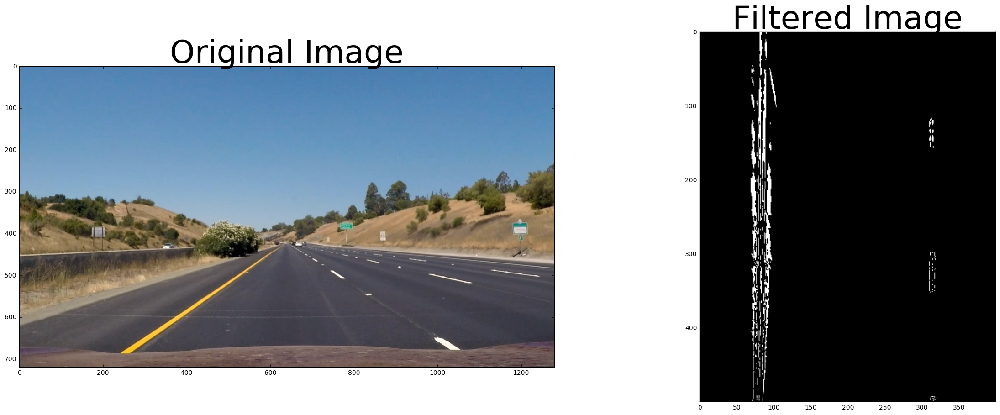

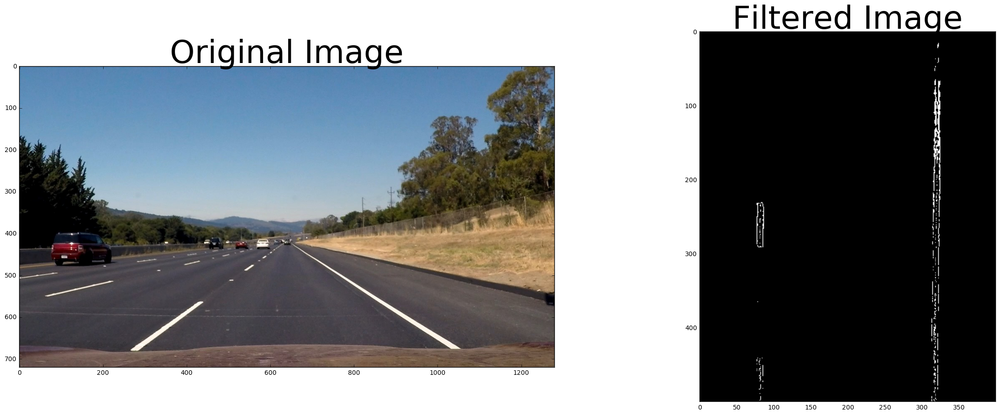

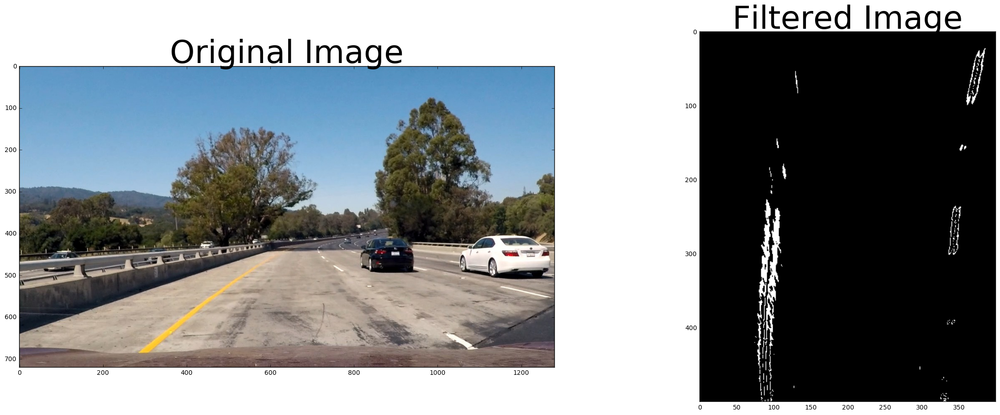

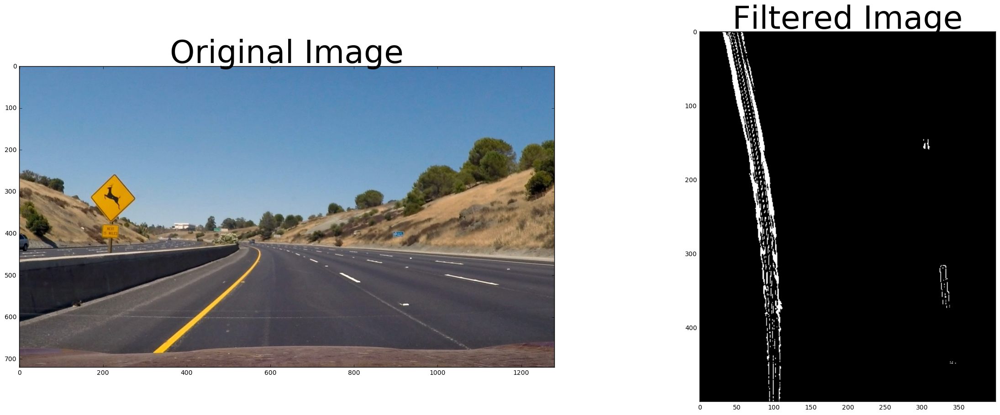

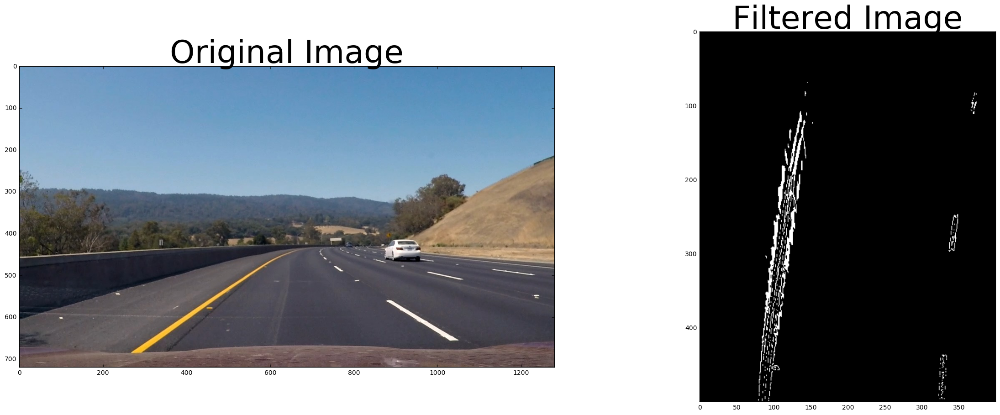

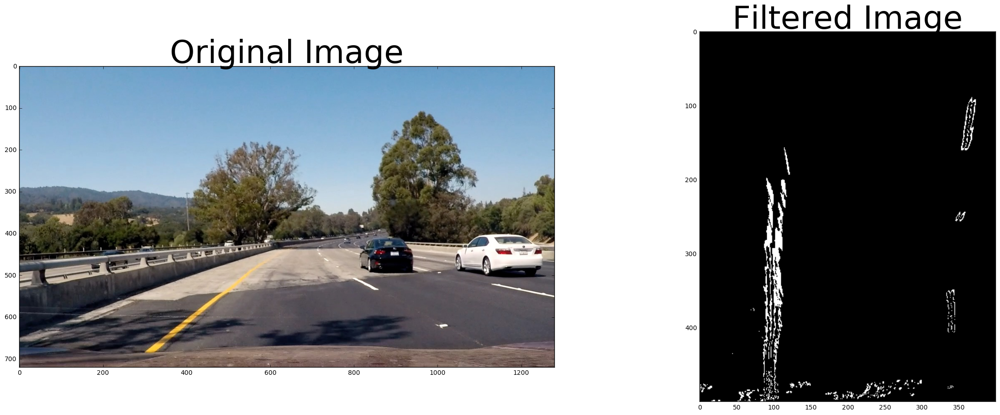

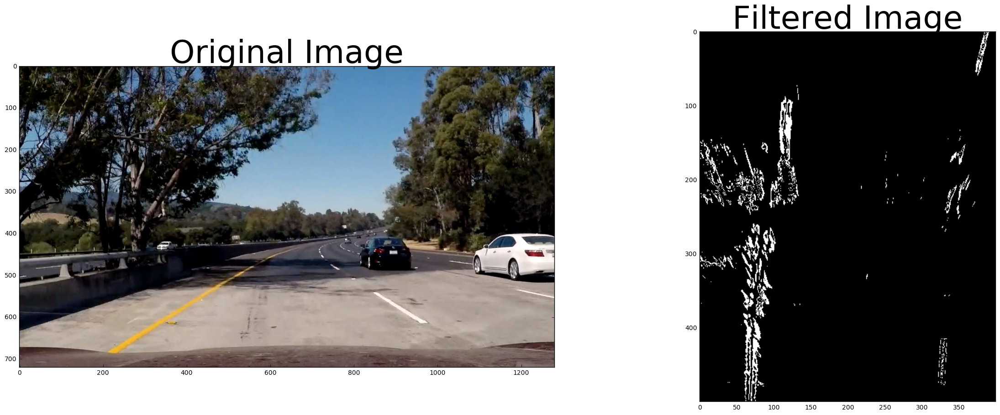

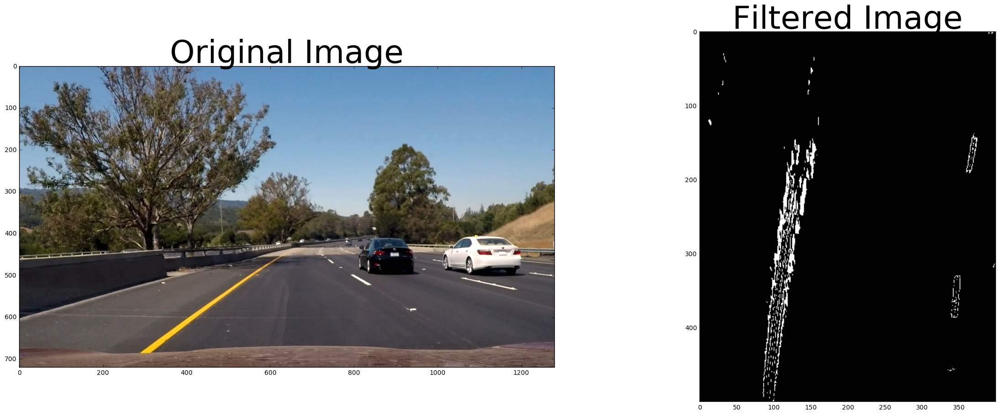

In [4]:
from lane_lines.filter import filter
from lane_lines.PerspectiveTransformer import ImageDistorter
from lane_lines.PerspectiveTransformer import RoadTransformer
import glob 

image_files = glob.glob("test_images/*.jpg")
distorter = ImageDistorter()
transformer = RoadTransformer()

for file in image_files:
  image = mpimg.imread(file)
  shape = image.shape[0:2]
  undistorted = distorter.undistort(image)
  warped = transformer.warped(undistorted)
  filtered = filter(warped)

  f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
  f.tight_layout()
  ax1.imshow(image)
  ax1.set_title('Original Image', fontsize=50)
  ax2.imshow(filtered, cmap='gray')
  ax2.set_title('Filtered Image', fontsize=50)
  plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
  plt.show()


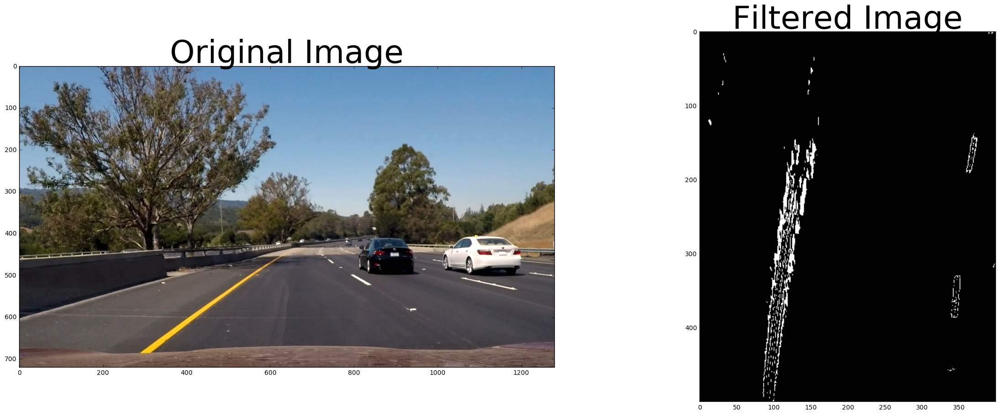

In [5]:

shape = image.shape[0:2]
undistorted = distorter.undistort(image)
warped = transformer.warped(undistorted)
filtered = filter(warped)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(filtered, cmap='gray')
ax2.set_title('Filtered Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

# plt.savefig('orig_distored_filtered.png')